# Transport of fluid particles in a periodic flow field

In [1]:
using ViscousStreaming
using LinearAlgebra

In [2]:
using JLD, FileIO
using Interpolations
# using DiffEqOperators
# using DifferentialEquations
using ProgressMeter
using QuadGK
#using FastGaussQuadrature
using OrdinaryDiffEq
using Statistics
import Statistics: mean

In [3]:
using LaTeXStrings
using Plots

clibrary(:colorbrewer)
default(clim = (-0.05, 0.05), markerstrokealpha = 0, markersize = 3, grid = false, 
     legend = true, colorbar = :right, colorbar_title = "\$\\Gamma\$")

In [4]:
using NamedColors

In [5]:
c_motion = colorant"Capri"
c_fixed = colorant"Black"
c_FullMR = colorant"Steel Blue"
c_AsympMR = colorant"purple" 
c_AvgMR = colorant"orange"
c_MixedMR = colorant"dark red"
c_Fluid = colorant"pinky purple"
c_AvgFluid = colorant"marine"
c_MixedFluid = colorant"Lucky"

## Set oscillatory motion of the cylinder

In [6]:
Re = 40.0
ϵ = 0.1
Ω = 1.0  # angular frequency
Ax1 = 1.0 # x amplitude (before scaling by ϵ)
ϕx1 = 0.0 # phase lead of x motion
Ay1 = 0.0 # y amplitude
ϕy1 = 0.0 # phase lead of y motion
basicoscil = RigidBodyMotions.RigidBodyMotion(RigidBodyMotions.Oscillation(Ω,Ax1,ϕx1,Ay1,ϕy1))

Tp = 2*π / Ω

6.283185307179586

Set the grid spacing and time step size for accessing the correct solution files

In [7]:
Δx = 0.02
Δt = min(π*0.5*Δx,π*0.5*Δx^2*Re)

0.025132741228718343

## Create Cylinder and surrounding domain

Set up bodies for later use in making plots

In [71]:
nbody = 2
n = 150
body = Bodies.Circle(1.0,n)
bL = deepcopy(body)
bR = deepcopy(body)
bRmotion = deepcopy(body)

cent = (-3.0,0.0)
α = 0.0
T = RigidTransform(cent,α)
T(bL)

cent = (3.0,0.0)
α = 0.0
T = RigidTransform(cent,α)
T(bR)

cent = (3.0-ϵ,0.0)
α = 0.0
T = RigidTransform(cent,α)
T(bRmotion)

bl = BodyList()
push!(bl,bL)
push!(bl,bR)

2-element Array{Body,1}:
 Circular body with 150 points and radius 1.0
   Current position: (-3.0,0.0)
   Current angle (rad): 0.0

 Circular body with 150 points and radius 1.0
   Current position: (3.0,0.0)
   Current angle (rad): 0.0
 

## Load data from CFD simulations

In [9]:
# create a function that loads the file containing the specified time for the desired case
function solnfile(t)
    tol = 1e-8
    Tendlist = [15.0,20.0,25.0,30.0]*Tp
    Tfile = 0.0
    for Tend in Tendlist
        if t <= Tend + tol
            Tfile = Tend
            break
        end
    end
    return "./CFD_data/2cylinder_t"*string(round(Int,Tfile/Tp))*"_eps"*string(ϵ)*"_dx_"*string(Δx)*"_dt_"*string(Δt)*".jld"
end

solnfile (generic function with 1 method)

In [45]:
#JLD.@load solnfile(29.0*Tp) data

1-element Array{Symbol,1}:
 :data

In [58]:
#@save "./CFD_data/2cylinder_steadyright_eps"*string(ϵ)*"_dx_"*string(Δx)*"_dt_"*string(Δt)*".jld" data_oneperiod

In [344]:
@load "./CFD_data/2cylinder_steadyright_t41_eps"*string(ϵ)*"_dx_"*string(Δx)*"_dt_"*string(Δt)*".jld" data_oneperiod

1-element Array{Symbol,1}:
 :data_oneperiod

In [345]:
data = data_oneperiod;

In [124]:
g = sys.grid
thist = data[5];

In [347]:
JLD.@load "./CFD_data/velocity2cylinder_steadyright_t41_eps"*string(ϵ)*"_dx_"*string(Δx)*"_dt_"*string(Δt)*".jld" uxhist uyhist u1xhist u1yhist g Δt thist

7-element Array{Symbol,1}:
 :uxhist 
 :uyhist 
 :u1xhist
 :u1yhist
 :g      
 :Δt     
 :thist  

In [348]:
u = ViscousStreaming.initialize_state(sys,length(bl))
for i in 1:4
    u[i] .= data[i][end]
end
t = data[5][end]

257.6105975944214

In [15]:
#=
pathsaveCFD = "./CFD_data/"
JLD2.@load pathsaveCFD*"steady_1cylinder_eps0.1_dx_0.02_dt_0.025132741228718343.jld2" w1hist w2hist dX1hist X̂hist thist
JLD2.@load pathsaveCFD*"velocity1cylinder_eps0.1_dx_0.02_dt_0.025132741228718343.jld2" uxhist uyhist u1xhist u1yhist g Δt thist
=#

5-element Array{Symbol,1}:
 :w1hist 
 :w2hist 
 :dX1hist
 :X̂hist 
 :thist  

The data set includes one period of the fluid vorticity field at each asymptotic level (`w1hist` and `w2hist`), *without* amplitude $\epsilon$ included, and the history of the first-order Eulerian displacement field `dX1hist`, the history of the cylinder centroid `X̂hist`, the time history itself `thist`.

The data set includes one period of the fluid velocity field (`uxhist` and `uyhist`) and one period of the first-order part, with amplitude $\epsilon$ included, in `u1xhist` and `u1yhist`. It also includes the time history itself `thist`, the grid data `g`, and the time step `Δt`.

In [126]:
torig = deepcopy(thist);

## Compute the full fluid particle trajectory

First make sure that the data set has a complete period (so that the first element and last elements are the same)

In [357]:
if !((thist[end]-thist[1])/(2π) ≈ 1)
    uxhist = cat(uxhist,uxhist[:,:,1],dims=3)
    uyhist = cat(uyhist,uyhist[:,:,1],dims=3)
    u1xhist = cat(u1xhist,u1xhist[:,:,1],dims=3)
    u1yhist = cat(u1yhist,u1yhist[:,:,1],dims=3)
    for j = 1:4
        push!(data[j],data[j][1])
    end
    push!(data[5],data[5][end]+Δt);
    push!(thist,thist[end]+Δt);
end

In [358]:
q̄ = Edges(Primal,size(g))
RangexuxCFD, RangeyuxCFD = coordinates(q̄.u, g)
RangexuyCFD, RangeyuyCFD = coordinates(q̄.v, g)
trangeCFD=Δt:Δt:2*π+Δt

0.025132741228718343:0.025132741228718343:6.308318048408304

In [359]:
uxipt3 = CubicSplineInterpolation((RangexuxCFD, RangeyuxCFD,trangeCFD), uxhist, extrapolation_bc = (Flat(),Flat(),Periodic()));
uyipt3 = CubicSplineInterpolation((RangexuyCFD, RangeyuyCFD,trangeCFD), uyhist, extrapolation_bc = (Flat(),Flat(),Periodic()));

In [360]:
function ufcn(dR,R,p,t)
    
   dR[1] = uxipt3(R[1],R[2],t)
   dR[2] = uyipt3(R[1],R[2],t)
    
   return dR 
end

ufcn (generic function with 1 method)

In [361]:
X₀ = (-1.0,3.0)
Tmax = 35000Tp

219911.4857512855

In [362]:
u0 = [X₀[1],X₀[2]]
tspan=(0.0,Tmax)
Path = ODEProblem(ufcn,u0,tspan)

ODEProblem with uType Array{Float64,1} and tType Float64. In-place: true
timespan: (0.0, 219911.4857512855)
u0: [-1.0, 3.0]

In [363]:
@time solFull = solve(Path,ABM54(), dt = Δt, adaptive = false, dense = false, progressbar = true);

 71.333464 seconds (457.98 M allocations: 8.675 GiB, 26.18% gc time)


In [289]:
pathsaveTrajectories = "../data_1cylinder/Trajectories/"
JLD2.@save pathsaveTrajectories*"FullFluidX0"*string(ceil(Int,10.0*X₀[1]))*
           string(ceil(Int,10.0*X₀[2]))*"Tmax"*
           string(ceil(Int,Tmax/T))*".jld2" solFull

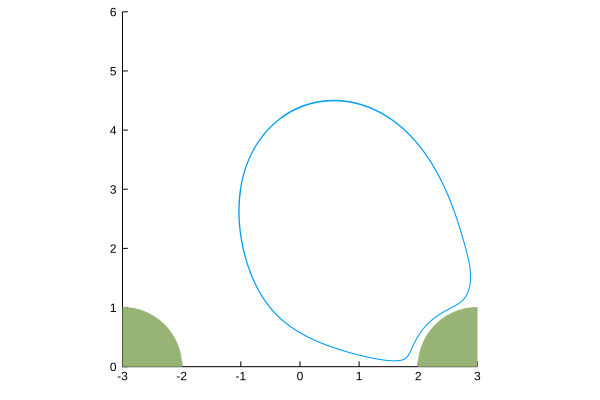

In [364]:
plot(solFull[1,1:250:end],solFull[2,1:250:end],ratio=1,xlim=(-3,3),ylim=(0,6))
plot!(bl)

## Construct Eulerian Reynolds decomposition of velocity field

#### Set up space-time arrays of the velocity components, with the first instant repeated at the end

In [365]:
q̄ = Edges(Primal,size(g))
q̄1 = deepcopy(q̄);

In [369]:
size(u1yhist)

(599, 600, 250)

#### Compute fluctuating part of the velocity components

First, set up vectors of the velocity in Edge data format

In [371]:
#thist = []
q̃x = typeof(q̄.u)[]
q̃y = typeof(q̄.v)[]
q̃1x = typeof(q̄1.u)[]
q̃1y = typeof(q̄1.v)[]
qtmp = deepcopy(q̄)
for (k,t) in enumerate(thist)
    qtmp.u .= selectdim(uxhist,3,k) #.- q̄.u
    qtmp.v .= selectdim(uyhist,3,k) #.- q̄.v
    push!(q̃x,deepcopy(qtmp.u))
    push!(q̃y,deepcopy(qtmp.v))
    qtmp.u .= selectdim(u1xhist,3,k) #.- q̄1.u
    qtmp.v .= selectdim(u1yhist,3,k) #.- q̄1.v
    push!(q̃1x,deepcopy(qtmp.u))
    push!(q̃1y,deepcopy(qtmp.v))
    #push!(thist,t)
end
#push!(q̃x,q̃x[1])
#push!(q̃y,q̃y[1])
#push!(q̃1x,q̃1x[1])
#push!(q̃1y,q̃1y[1])
#push!(thist,thist[1]);

In [144]:
"""
    reynolds_decomposition!(q̄::Edges,q̃x::Vector{XEdges},q̃y::Vector{YEdges},itr)

Perform a Reynolds decomposition of the vectors of velocity component histories `q̃x` and `q̃y`. Both
components of the mean are placed in `q̄`, and the original vectors of component histories are
overwritten with the fluctuations from the mean. The mean is computed over the range `itr`. 
"""
function reynolds_decomposition!(q̄::Edges,q̃x::Vector{S},q̃y::Vector{T},itr) where {S<:XEdges, T<:YEdges}
    q̄.u .= mean(q̃x[itr])
    q̄.v .= mean(q̃y[itr]);
    q̃x .= map(q -> q - q̄.u,q̃x)
    q̃y .= map(q -> q - q̄.v,q̃y)
    
    return q̄, q̃x, q̃y
end

reynolds_decomposition!

#### Perform Reynolds decomposition of the velocity and first-order velocity

In [372]:
reynolds_decomposition!(q̄,q̃x,q̃y,1:length(thist[1:end-1]));
reynolds_decomposition!(q̄1,q̃1x,q̃1y,1:length(thist[1:end-1]));

#### Now create time-varying (periodic) functions of the fluctuating velocity components

In [300]:
#q̃xt = CubicSplineInterpolation(trangeCFD,q̃x,extrapolation_bc=Periodic())
#q̃yt = CubicSplineInterpolation(trangeCFD,q̃y,extrapolation_bc=Periodic())
q̃1xt = CubicSplineInterpolation(trangeCFD,q̃1x,extrapolation_bc=Periodic())
q̃1yt = CubicSplineInterpolation(trangeCFD,q̃1y,extrapolation_bc=Periodic())
nothing

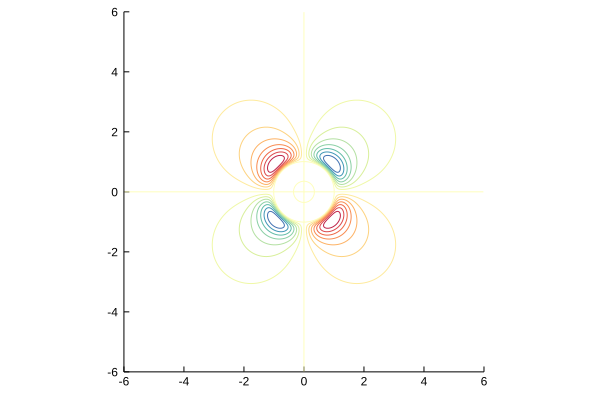

In [18]:
contour(RangexuyCFD, RangeyuyCFD, transpose(q̃1yt(2π)),ratio=1,xlim=(-6,6),ylim=(-6,6),colorbar=false,clim=(-0.07,0.07))

## Compute the disturbed displacement field $\xi$

In [147]:
TimeMarching.r₁(ξ::T,t::Float64) where {T <: VectorGridData} = T(q̃1xt(t),q̃1yt(t))

In [148]:
ξ = zero(q̄);

In [149]:
u = deepcopy(ξ)
@time rk = RK(u, Δt,TimeMarching.r₁, rk=TimeMarching.RK31)

  2.278413 seconds (3.23 M allocations: 383.932 MiB, 45.73% gc time)


Order-3 RK integator with
   State of type Edges{Primal,600,600}
   Time step size 0.025132741228718343


In [150]:
# # Store history
t = 0.0
t_hist = Float64[]
ξ_hist = typeof(ξ)[]
u = deepcopy(ξ)
@showprogress for ti in collect(0.0:Δt:2*π)[1:end-1]
    push!(ξ_hist,deepcopy(u))
    push!(t_hist,copy(t))
    global t,u = rk(t,u);   
end

push!(ξ_hist,deepcopy(u))
push!(t_hist,copy(t));

Progress: 100%|█████████████████████████████████████████| Time: 0:00:32


Remove the mean from the disturbed displacement field. This non-zero mean arose because our initial condition was incompatible with the velocity, which started at some arbitrary phase. This fixes the initial condition for $\xi$.

In [151]:
ξavg = mean(ξ_hist[1:length(torig)]);
ξ_hist .= map(ξ -> ξ - ξavg,ξ_hist);

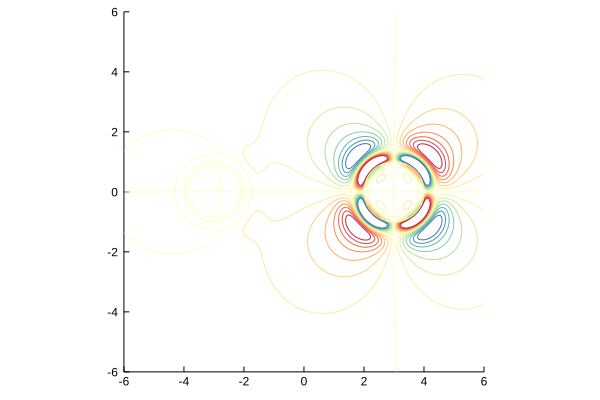

In [197]:
contour(RangexuyCFD, RangeyuyCFD, transpose(ξ_hist[1].v),ratio=1,xlim=(-6,6),ylim=(-6,6),colorbar=false,clim=(-0.01,0.01))

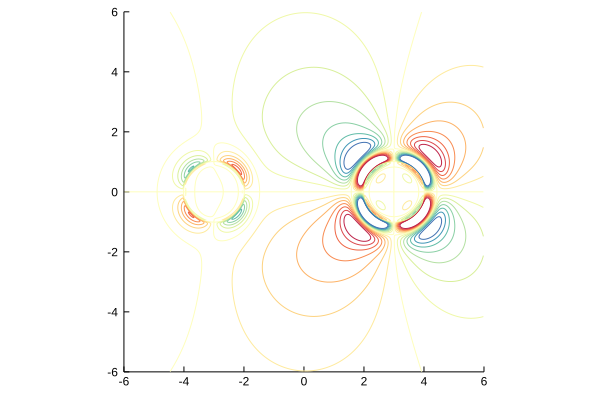

In [199]:
contour(RangexuyCFD, RangeyuyCFD, transpose(ϵ*data[3][1].v),ratio=1,xlim=(-6,6),ylim=(-6,6),colorbar=false,clim=(-0.01,0.01))

## Now compute the Stokes drift, $\xi\cdot\nabla u$, and the Lagrangian mean velocity, $\overline{u}^L = \overline{u} + \overline{\xi\cdot\nabla u}$

Compute the gradient of the first-order fluctuating velocity field

In [164]:
"""
    cross!(out,f,q)

Compute the cross product of `f` and `q`, ``f\\times q``,
and put the result into `out`.
"""
function cross!(out::Nodes{Dual},f::Edges{Primal},q::Edges{Primal})
    
    # some temp storage
    qx_dual = Nodes(Dual,f)
    qy_dual = Nodes(Dual,f)

    fx_dual = Nodes(Dual,f)
    fy_dual = Nodes(Dual,f)
        
    ViscousFlow.interpolate!((qx_dual,qy_dual),q)
    ViscousFlow.interpolate!((fx_dual,fy_dual),f)

    out .= fx_dual ∘ qy_dual - qx_dual ∘ fy_dual
    
    return out
    
end

cross!

In [133]:
function directional_derivative_symm!(out::Edges{Primal},f::Edges{Primal},q::Edges{Primal})
    
    out1 = deepcopy(out)
    directional_derivative_conserve!(out1,f,q)
    out .= 0.5*out1
    directional_derivative_conserve!(out1,q,f)
    out .+= 0.5*out1
    directional_derivative_rot!(out1,f,q)
    out .+= out1
    
    return out
end

directional_derivative_symm! (generic function with 1 method)

Compute the directional derivative $\xi\cdot\nabla u$ at each time, store the result in `q̃d`

In [254]:
#=
q̃tmp = Edges(Primal,ξ);
q̃d = typeof(ξ)[]
for (i,ξi) in enumerate(ξ_hist)
    directional_derivative!(q̃tmp,typeof(ξ)(q̃1x[i],q̃1y[i]),ξi)
    q̃tmp /= cellsize(g)
    push!(q̃d,deepcopy(q̃tmp))
end
=#

InterruptException: InterruptException:

In [373]:
q̃tmp = Edges(Primal,data[3][1]);
q̃d = typeof(data[3][1])[]
for (i,ξi) in enumerate(data[3])
    directional_derivative!(q̃tmp,typeof(data[3][1])(q̃1x[i],q̃1y[i]),ϵ*ξi)
    q̃tmp /= cellsize(g)
    push!(q̃d,deepcopy(q̃tmp))
end

In [255]:
#=
q̃tmp = Edges(Primal,ξ);
q̃da = typeof(ξ)[]
for (i,ξi) in enumerate(ξ_hist)
    directional_derivative!(q̃tmp,ξi,typeof(ξ)(q̃1x[i],q̃1y[i]))
    q̃tmp /= -cellsize(g)
    push!(q̃da,deepcopy(q̃tmp))
end
=#

In [374]:
q̃tmp = Edges(Primal,data[3][1]);
q̃da = typeof(data[3][1])[]
for (i,ξi) in enumerate(data[3])
    directional_derivative!(q̃tmp,ϵ*ξi,typeof(data[3][1])(q̃1x[i],q̃1y[i]))
    q̃tmp /= -cellsize(g)
    push!(q̃da,deepcopy(q̃tmp))
end

#### Compute the mean of the directional derivative for the Stokes drift
Make sure to only include one period's worth

In [375]:
q̄d = mean(q̃d[1:length(thist[1:end-1])]);

In [376]:
q̄da = mean(q̃da[1:length(thist[1:end-1])]);

### Finally, assemble the mean Lagrangian velocity

In [377]:
q̄L = q̄ + 0.5*(q̄d+q̄da);

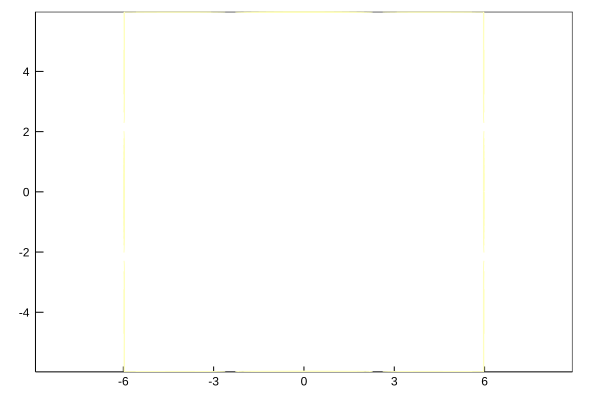

In [412]:
divqL = divergence(q̄L)/cellsize(gCFD)
xg, yg = coordinates(divqL,gCFD)
plot(xg,yg,divqL,ratio=1,clim=(-1e-3,1e-3),colorbar=false)

## Compute the Lagrangian streamfunction field

Compute the mean Eulerian streamfunction

In [378]:
itr = 1:length(thist[1:end-1])
w2avg = mean(data[2][itr])
ψ̄₂ = streamfunction(w2avg,sys);

Compute the drift streamfunction

$\psi_d = \frac{1}{2} \overline{v_1 \times \xi_1}$

In [379]:
itr = 1:length(thist[1:end-1])
ψd = zero(data[2][1])
ψdhist = typeof(ψd)[]
for (i,ξi) in enumerate(ξ_hist)
    #cross!(ψd,typeof(ξ)(q̃1x[i],q̃1y[i]),ξi)
    cross!(ψd,typeof(ξ)(q̃1x[i],q̃1y[i]),ϵ*data[3][i])
    push!(ψdhist,0.5*ψd)
end
ψd .= mean(ψdhist[itr])/ϵ^2;

In [380]:
ψ̄₂d = deepcopy(ψ̄₂)
ψ̄₂d .+= ψd;

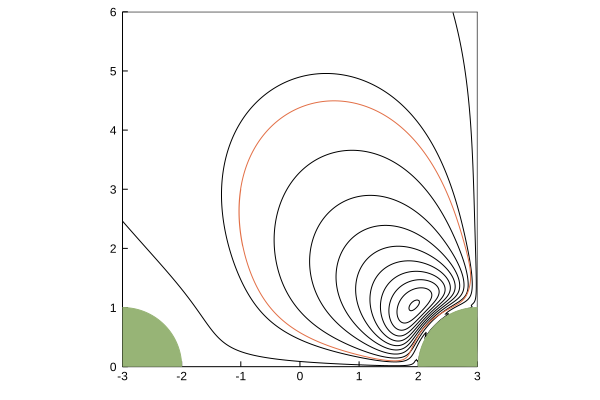

In [403]:
xg, yg = coordinates(ψ̄₂d,g)
plot(xg,yg,ψ̄₂d,ratio=1,colorbar=false,xlim=(-3,3),ylim=(0,6),levels=range(-0.2,0.12,length=31),clim=(-0.2,0.12),color=:black)
plot!(solFull[1,1:250:3500000],solFull[2,1:250:3500000],ratio=1,xlim=(-3,3),ylim=(0,6))
plot!(bl)

In [219]:
JLD2.@save pathsaveCFD*"Lagrangian_Eulerian_streamfunc_1cylinder_eps0.1_dx_0.02_dt_0.025132741228718343.jld2" ψd ψ̄₂ ψ̄₂d xg yg g Δt

## Now create a continuous spatial function of mean Lagrangian velocity

In [381]:
q̄Luxy = CubicSplineInterpolation((RangexuxCFD, RangeyuxCFD),q̄L.u, extrapolation_bc = (Flat(),Flat()))
q̄Lvxy = CubicSplineInterpolation((RangexuyCFD, RangeyuyCFD),q̄L.v, extrapolation_bc = (Flat(),Flat()))
nothing

In [327]:
q̄uxy = CubicSplineInterpolation((RangexuxCFD, RangeyuxCFD),q̄.u, extrapolation_bc = (Flat(),Flat()))
q̄vxy = CubicSplineInterpolation((RangexuyCFD, RangeyuyCFD),q̄.v, extrapolation_bc = (Flat(),Flat()))
nothing

## Now integrate mean particle trajectories

In [382]:
# Note that this function is only evaluated at the time steps used in the mean trajectory, e.g., every 10 periods.
function q̄Lfcn(dR,R,p,t)
    
   dR[1] = q̄Luxy(R[1],R[2])
   dR[2] = q̄Lvxy(R[1],R[2])
    
   return dR 
end

q̄Lfcn (generic function with 1 method)

In [329]:
function q̄fcn(dR,R,p,t)
    
   dR[1] = q̄uxy(R[1],R[2])
   dR[2] = q̄vxy(R[1],R[2])
    
   return dR 
end

q̄fcn (generic function with 1 method)

In [425]:
X₀ = (-1.0,3.0)
Tmax = 35000Tp

219911.4857512855

In [426]:
u0 = [X₀[1],X₀[2]]
tspan=(0.0,Tmax)
PathL = ODEProblem(q̄Lfcn,u0,tspan)

ODEProblem with uType Array{Float64,1} and tType Float64. In-place: true
timespan: (0.0, 219911.4857512855)
u0: [-1.0, 3.0]

In [427]:
# @time solFluidavg = solve(PathFluidavg,solver = SSPRK104(), dt= 20*T,adaptive = false, dense=true); ARKODE(Sundials.Implicit(),order = 3)
@time solLm1030 = solve(PathL,ABM54(), dt = Tp, adaptive = false, dense = false, progressbar = true);

  0.068924 seconds (1.12 M allocations: 24.840 MiB, 14.38% gc time)


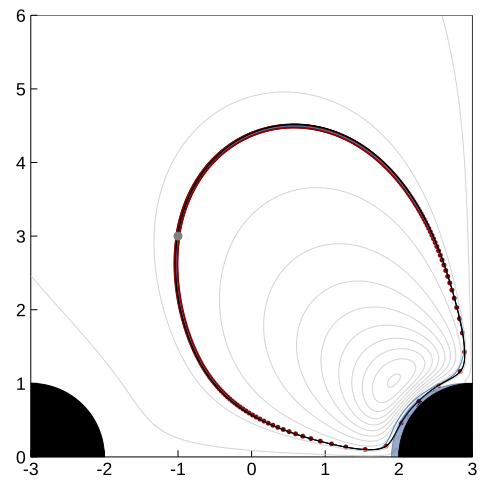

In [457]:
#ps = plot(solL[1,:],solL[2,:],ratio=1,linewidth=1,color=c_MixedMR)
#scatter!(solL[1,1:3:180],solL[2,1:3:180],markercolor=c_MixedMR)
#ps = plot(solLm1030[1,1:10*1266],solLm1030[2,1:10*1266],ratio=1,linewidth=1,color=c_MixedMR)
ps = scatter(solLm1030[1,1:30:12660],solLm1030[2,1:30:12660],ratio=1,markercolor=c_MixedMR)
plot!(xg,yg,ψ̄₂d,ratio=1,colorbar=false,xlim=(-3,3),ylim=(0,6),
    levels=range(-0.2,0.12,length=31),clim=(-0.2,0.12),color=:lightgrey)
plot!(solFull[1,1:250:3500000],solFull[2,1:250:3500000],ratio=1,linewidth=1,color=c_FullMR)
plot!(xg,yg,ψ̄₂d,ratio=1,colorbar=false,
    levels=[0.0162,0.0162],clim=(-0.2,0.12),color=:black)
plot!(bRmotion,fillcolor=c_motion,linecolor=c_motion, opacity =0.4)
plot!(bl,fillcolor=c_fixed,linecolor=c_fixed,
#    background_color=:transparent,
    xtickfont = font(12),
#     xlabel ="x/R",
#     guidefont = font(8,"Courier"),
# ylabel = "y/R",
    ytickfont = font(12),
    legend =false, size = (500,500))
scatter!([X₀[1]],[X₀[2]],marker = 5, color = :grey)
#scatter!([2.0],[2.0],marker = 5, color = :grey)

In [458]:
savefig(ps,"Comparison_2Cyl_FluidTraj.pdf")

In [327]:
ps = plot(solFull[1,1:450000],solFull[2,1:450000],ratio=1,linewidth=0.5,color=c_FullMR)
plot!(solL[1,1:181],solL[2,1:181],ratio=1,linewidth=2.5,color=c_MixedMR,xlim=(0,2.5),ylim=(0,2.5))
#plot!(xg,yg,ψ̄₂d,ratio=1,colorbar=false,xlim=(0,2.5),ylim=(0,2.5),
#    levels=range(-0.12,-0.011,length=10),clim=(-0.12,-0.011),color=:navyblue)
#plot!(xg,yg,ψ̄₂d,ratio=1,colorbar=false,xlim=(0,2.5),ylim=(0,2.5),
#    levels=[-0.0544,-0.0544],clim=(-0.12,-0.011),color=:black)
plot!(bodymotion,fillcolor=c_motion,linecolor=c_motion, opacity =0.4)
plot!(body,fillcolor=c_fixed,linecolor=c_fixed,
#    background_color=:transparent,
    xtickfont = font(12),
#     xlabel ="x/R",
#     guidefont = font(8,"Courier"),
# ylabel = "y/R",
    ytickfont = font(12),
    legend =false, size = (500,500))
scatter!([X₀[1]],[X₀[2]],marker = 5, color = :grey)

In [328]:
savefig(ps,"Comparison_FullFluidTraj_2020.pdf")

In [330]:
10*250

2500

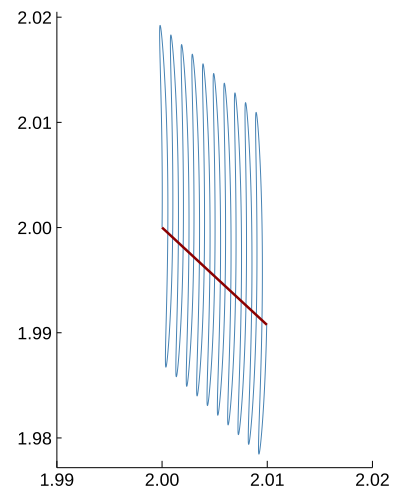

In [340]:
ps = plot(solFull[1,1:2501],solFull[2,1:2501],ratio=1,linewidth=1,color=c_FullMR)
plot!(solL[1,1:2],solL[2,1:2],ratio=1,linewidth=2.5,color=c_MixedMR,legend=false,xlim=(1.99,2.02),xtickfont = font(12),
    ytickfont = font(12),size = (400,500))

In [341]:
savefig(ps,"Comparison_FullFluidTrajZoom_2020.pdf")

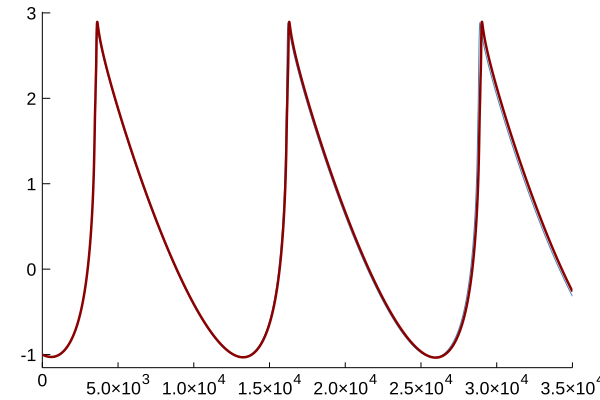

In [449]:
ps = plot(solFull.t[1:250:end]/Tp,solFull[1,1:250:end],linecolor=c_FullMR,linewidth=1)
ps = plot!(solLm1030.t/Tp,solLm1030[1,:],legend=false,
    linewidth=2.5,linecolor=c_MixedMR,xtickfont = font(12),ytickfont = font(12),xlim=(0,35000))

In [436]:
savefig(ps,"Comparison_2Cyl_FullFluidTrajX_m1030.pdf")

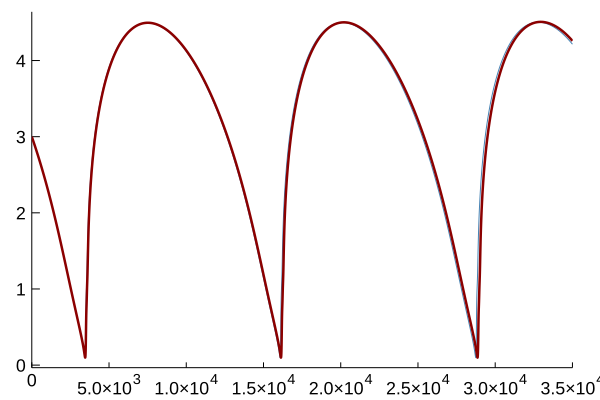

In [448]:
ps2 = plot(solFull.t[1:250:end]/Tp,solFull[2,1:250:end],linecolor=c_FullMR,linewidth=1)
ps2 = plot!(solLm1030.t/Tp,solLm1030[2,:],legend=false,
    linewidth=2.5,linecolor=c_MixedMR,xtickfont = font(12),ytickfont = font(12),xlim=(0,35000))

In [453]:
plot(ps,ps2,layout=(2,1),size=(600,600))

In [454]:
savefig("Comparison_2Cyl_FullFluidTrajXY_m1030.pdf")

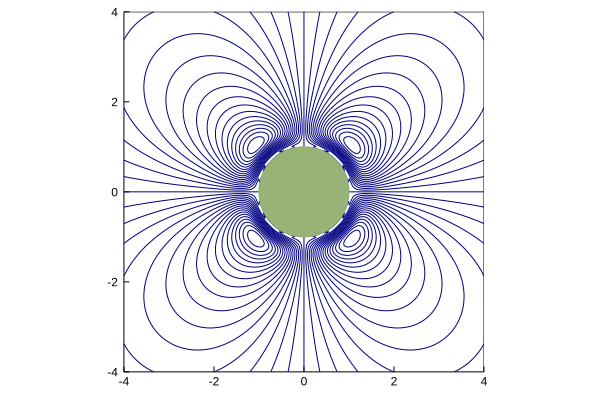

In [250]:
plot(xg,yg,ψ̄₂d,ratio=1,colorbar=false,xlim=(-4,4),ylim=(-4,4),
    levels=range(-0.125,0.125,length=41),clim=(-0.125,0.125),color=:navyblue)
plot!(body)